In [1]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 
  
# data (as pandas dataframes) 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 
  
# metadata 
print(breast_cancer_wisconsin_diagnostic.metadata) 
  
# variable information 
print(breast_cancer_wisconsin_diagnostic.variables) 


{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'ID': 230, 'type': 'NATIVE', 'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'venue': 'Electronic imaging', 'year': 1993, 'journal': None, 'DOI': '1

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix, make_scorer
from sklearn.model_selection import StratifiedKFold
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.utils import to_categorical
import optuna
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import shap
import lightgbm as lgb
import os
import tensorflow as tf
import random
from optuna import Trial
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Diagnosis  569 non-null    object
dtypes: object(1)
memory usage: 4.6+ KB


In [4]:
y['Diagnosis'].value_counts()

Diagnosis
B    357
M    212
Name: count, dtype: int64

In [5]:
y['Diagnosis'] == "M"

0       True
1       True
2       True
3       True
4       True
       ...  
564     True
565     True
566     True
567     True
568    False
Name: Diagnosis, Length: 569, dtype: bool

In [6]:
y.loc[:, 'Diagnosis'] = y['Diagnosis'] == "M"

In [7]:
y = y['Diagnosis']

In [8]:
y.value_counts()

Diagnosis
False    357
True     212
Name: count, dtype: int64

In [9]:
y = y.astype(int)

In [10]:
X.shape

(569, 30)

In [11]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             569 non-null    float64
 1   texture1            569 non-null    float64
 2   perimeter1          569 non-null    float64
 3   area1               569 non-null    float64
 4   smoothness1         569 non-null    float64
 5   compactness1        569 non-null    float64
 6   concavity1          569 non-null    float64
 7   concave_points1     569 non-null    float64
 8   symmetry1           569 non-null    float64
 9   fractal_dimension1  569 non-null    float64
 10  radius2             569 non-null    float64
 11  texture2            569 non-null    float64
 12  perimeter2          569 non-null    float64
 13  area2               569 non-null    float64
 14  smoothness2         569 non-null    float64
 15  compactness2        569 non-null    float64
 16  concavit

In [12]:
sns.pairplot(X, height=2.5)
plt.suptitle('Pairplot of features')
plt.show()

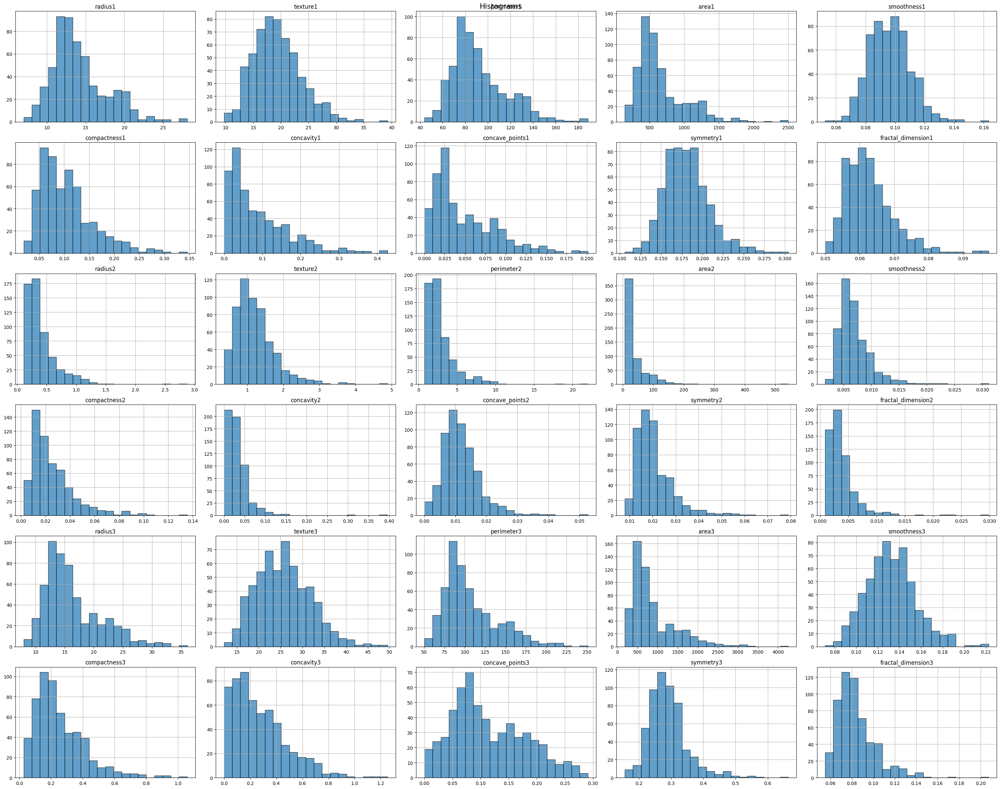

In [13]:
X.hist(figsize=(30, 24), bins=20, edgecolor='black', alpha=0.7)

# Adjust design
plt.suptitle("Histograms", fontsize=16)
plt.tight_layout()
plt.show()

# Train and Test Split

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=12345)

In [15]:
# Verify the class distribution before and after the split
print("Original distribution")
print(y.value_counts(normalize=True))

print("\ntrain_target distribution:")
print(y_train.value_counts(normalize=True))

print("\ntest_target distribution:")
print(y_test.value_counts(normalize=True))

Original distribution
Diagnosis
0    0.627417
1    0.372583
Name: proportion, dtype: float64

train_target distribution:
Diagnosis
0    0.626761
1    0.373239
Name: proportion, dtype: float64

test_target distribution:
Diagnosis
0    0.629371
1    0.370629
Name: proportion, dtype: float64


### Verify the distribution of features variables among the test and train subsets are similar

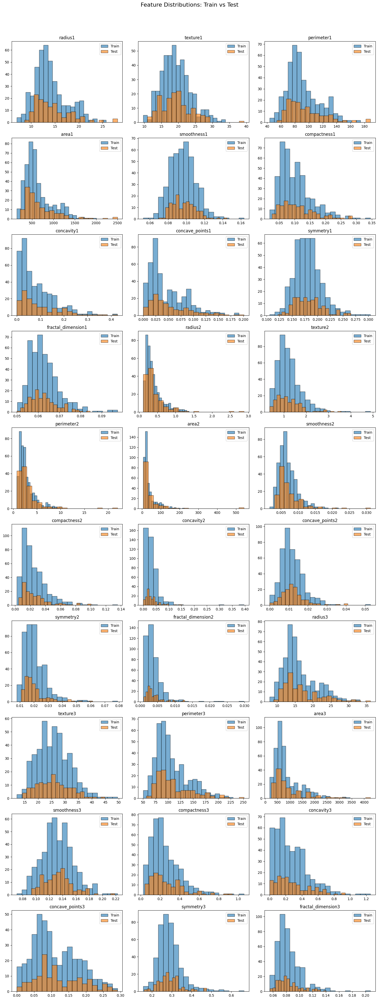

In [16]:
# Get list of features
features = X_train.columns

# Set number of columns per row in the final plot grid
n_cols = 3
n_rows = (len(features) + n_cols - 1) // n_cols  # Ceiling division

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # Flatten in case it's 2D

for idx, feature in enumerate(features):
    ax = axes[idx]
    
    # Plot histograms for both datasets
    ax.hist(X_train[feature], bins=20, alpha=0.6, label='Train', edgecolor='black')
    ax.hist(X_test[feature], bins=20, alpha=0.6, label='Test', edgecolor='black')
    
    ax.set_title(feature)
    ax.legend()

# Remove any unused axes
for i in range(len(features), len(axes)):
    fig.delaxes(axes[i])

# Final layout
plt.suptitle("Feature Distributions: Train vs Test", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
plt.show()

# Scaling features

In [17]:
#Fit and transform train features
scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_train = pd.DataFrame(scaled_X_train, columns=X_train.columns)

#Transform test features
scaled_X_test = scaler.transform(X_test)
scaled_X_test = pd.DataFrame(scaled_X_test, columns=X_test.columns)

# Building ML models

### Define function to conduct K-fold cross validation on the ML models

In [18]:
def kfold_cross_validation(model, X, y, k_folds=5):
    """
    Evaluates a model with K-fold Cross Validation and calculates the metrics: accuracy, precision, recall, F1, AUC-ROC,
    and returns the confusion matrix.

    Parameters:
    model: A Scikit-Learn or compatible machine learning model.
    X: The dataset characteristics.
    y: The target or label of the dataset.
    k_folds: Number of folds in K-fold cross validation.

    Returns:
    dict: A dictionary containing the model's performance metrics, including the confusion matrix.
    """
    # Initialize the StratifiedKFold object for stratified cross-validation
    cv = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=12345)
    
    # Initialize lists to store metrics for each fold
    accuracies = []
    precisions = []
    recalls = []
    f1_scores = []
    auc_roc_scores = []
    confusion_matrices = []

    # We perform cross-validation
    for train_index, valid_index in cv.split(X, y):
        # Split the data into training and validation sets
        X_train, X_valid = X.iloc[train_index], X.iloc[valid_index]
        y_train, y_valid = y.iloc[train_index], y.iloc[valid_index]
        
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict the target
        y_pred = model.predict(X_valid)
        
        # Calculate the metrics
        accuracies.append(accuracy_score(y_valid, y_pred))
        precisions.append(precision_score(y_valid, y_pred, average='binary', zero_division=0))
        recalls.append(recall_score(y_valid, y_pred, average='binary'))
        f1_scores.append(f1_score(y_valid, y_pred, average='binary'))
        
        # AUC-ROC only for binary classification
        if len(np.unique(y)) == 2:  # only for binary classification
            auc_roc_scores.append(roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]))
        else:
            auc_roc_scores.append(np.nan)  # If not binary, no calculation of AUC-ROC
        
        # Compute confusion matrix for the fold
        cm = confusion_matrix(y_valid, y_pred)
        confusion_matrices.append(cm)
    
    # Calculate the average confusion matrix
    avg_cm = np.mean(confusion_matrices, axis=0)

    # Calculation of loss function means
    metrics = {
        'accuracy': np.mean(accuracies),
        'precision': np.mean(precisions),
        'recall': np.mean(recalls),
        'f1_score': np.mean(f1_scores),
        'auc_roc': np.nanmean(auc_roc_scores),  # If there are Nans in AUC-ROC, it will be ignored
        'confusion_matrix': avg_cm
    }
    
    return metrics

### Logistic Regression Model

In [19]:
#Define Logistic Regression Model
lr_model = LogisticRegression(solver='liblinear', class_weight='balanced', random_state=12345)

In [20]:
kfold_cross_validation(lr_model, scaled_X_train, y_train)

{'accuracy': np.float64(0.9742270861833106),
 'precision': np.float64(0.9635650623885919),
 'recall': np.float64(0.96875),
 'f1_score': np.float64(0.9654606325574069),
 'auc_roc': np.float64(0.9958093116701608),
 'confusion_matrix': array([[52.2,  1.2],
        [ 1. , 30.8]])}

In [21]:
lr_model.fit(scaled_X_train, y_train)

LogisticRegression(class_weight='balanced', random_state=12345,
                   solver='liblinear')

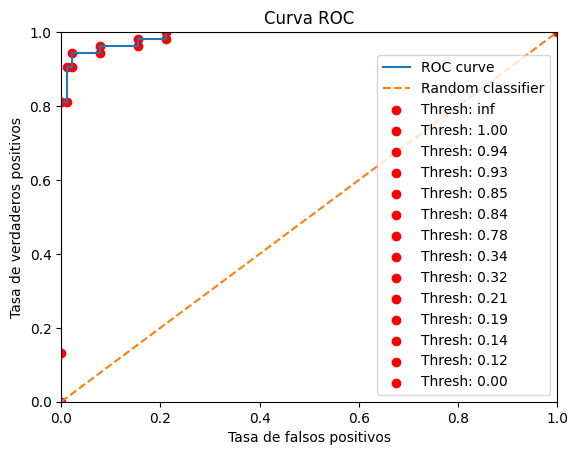

In [95]:
# Get predicted probabilities
probabilities_valid = lr_model.predict_proba(X_test)
probabilities_one_valid = probabilities_valid[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, probabilities_one_valid)

# Plot ROC curve
plt.figure()

# Plot the ROC curve
plt.plot(fpr, tpr, label="ROC curve")

# Plot a random classifier (diagonal line)
plt.plot([0, 1], [0, 1], linestyle='--', label="Random classifier")

# Plot the thresholds on the ROC curve
for i in range(0, len(thresholds), len(thresholds)//10):  # Adjust step for more/less threshold points
    plt.scatter(fpr[i], tpr[i], label=f'Thresh: {thresholds[i]:.2f}', color='red')

# Set the limits for the axes
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

# Label the axes
plt.xlabel("Tasa de falsos positivos")
plt.ylabel("Tasa de verdaderos positivos")

# Add title and legend
plt.title("Curva ROC")
plt.legend(loc="lower right")

# Show the plot
plt.show()

In [22]:
lr_model.coef_

array([[ 0.10539189,  0.16159648,  0.09419416,  0.19437534,  0.07265566,
        -0.42676682,  0.75735468,  0.81789344, -0.0196385 , -0.19789191,
         1.13083015,  0.08662821,  0.75170938,  1.06337811, -0.58596858,
        -0.73226195, -0.21513134,  0.12835223, -0.2670588 , -0.67032293,
         0.86240934,  1.31081335,  0.78844355,  0.87230204,  0.70429523,
         0.07580433,  0.87060991,  1.03158842,  0.62322653,  0.46995151]])

In [23]:
lr_model.intercept_

array([-0.05420729])

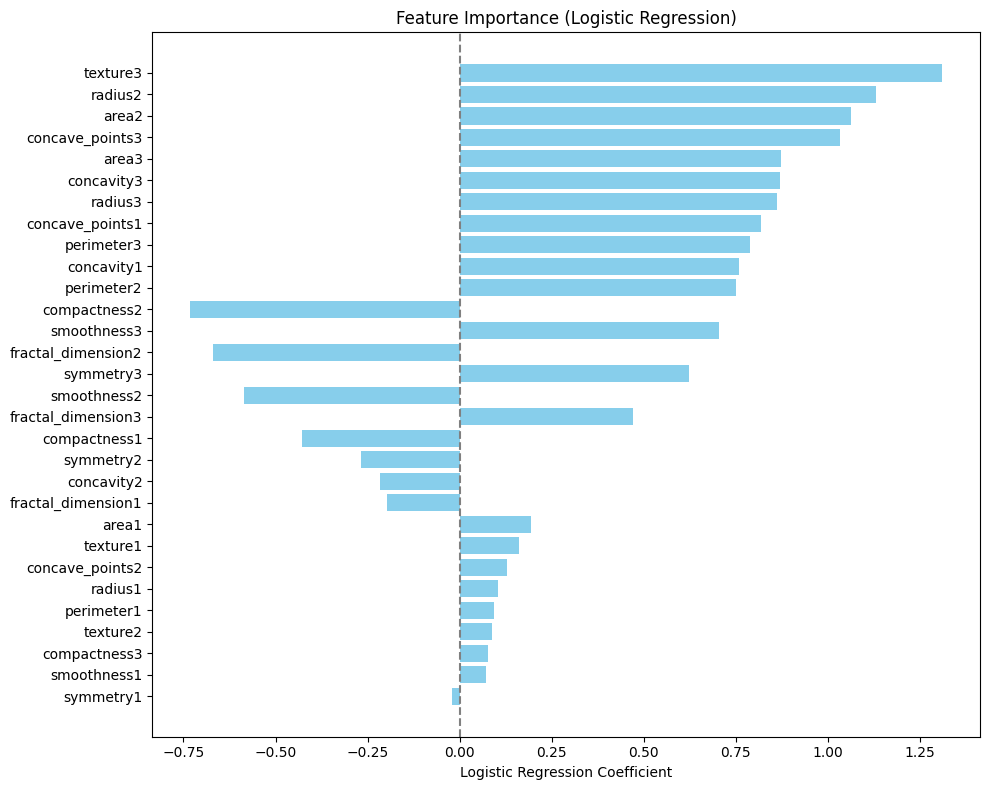

In [24]:
# Get the coefficients
coefficients = lr_model.coef_[0]  # shape: (n_features,)

# Get feature names
feature_names = X.columns  # or scaled_X_train.columns if you're using scaled data

# Create a pandas Series for easy sorting and labeling
coef_series = pd.Series(coefficients, index=feature_names)

# Sort the coefficients by absolute value (most important at the bottom)
sorted_coef = coef_series.reindex(coef_series.abs().sort_values().index)

# Plot
plt.figure(figsize=(10, 8))
plt.barh(sorted_coef.index, sorted_coef.values, color='skyblue')
plt.axvline(x=0, color='gray', linestyle='--')  # optional: vertical line at 0
plt.xlabel("Logistic Regression Coefficient")
plt.title("Feature Importance (Logistic Regression)")
plt.tight_layout()
plt.show()


In [25]:
# Create the SHAP explainer object
lr_explainer = shap.LinearExplainer(lr_model, scaled_X_train)

In [26]:
# Calculate SHAP values for the test set
lr_shap_values = lr_explainer.shap_values(scaled_X_test)

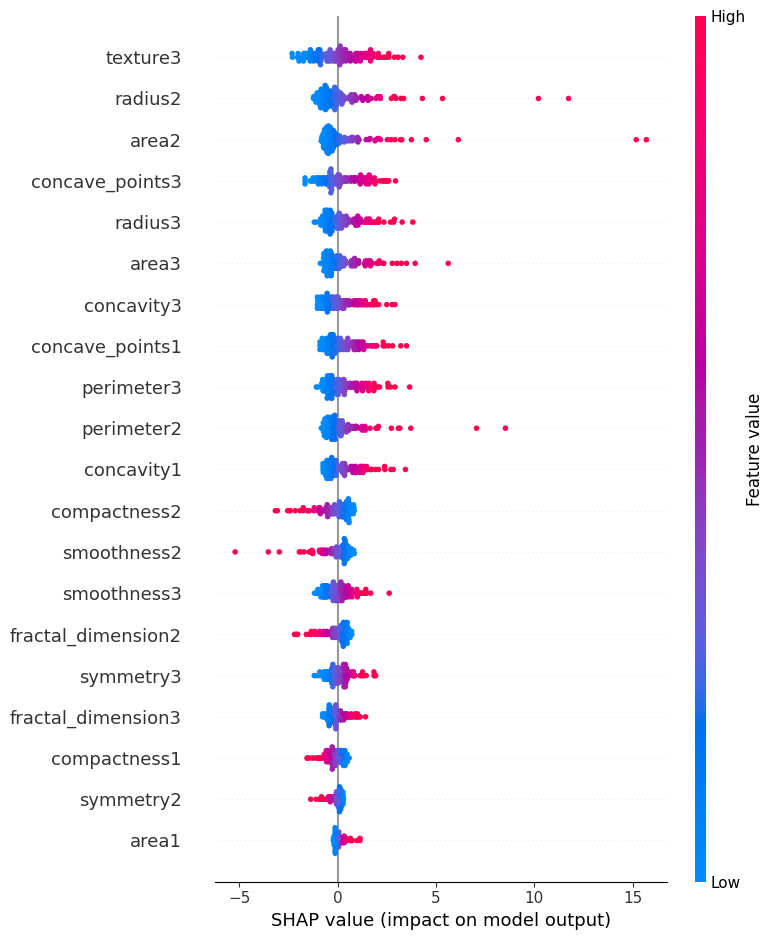

In [27]:
# Summary plot for all test samples
shap.summary_plot(lr_shap_values, scaled_X_test)

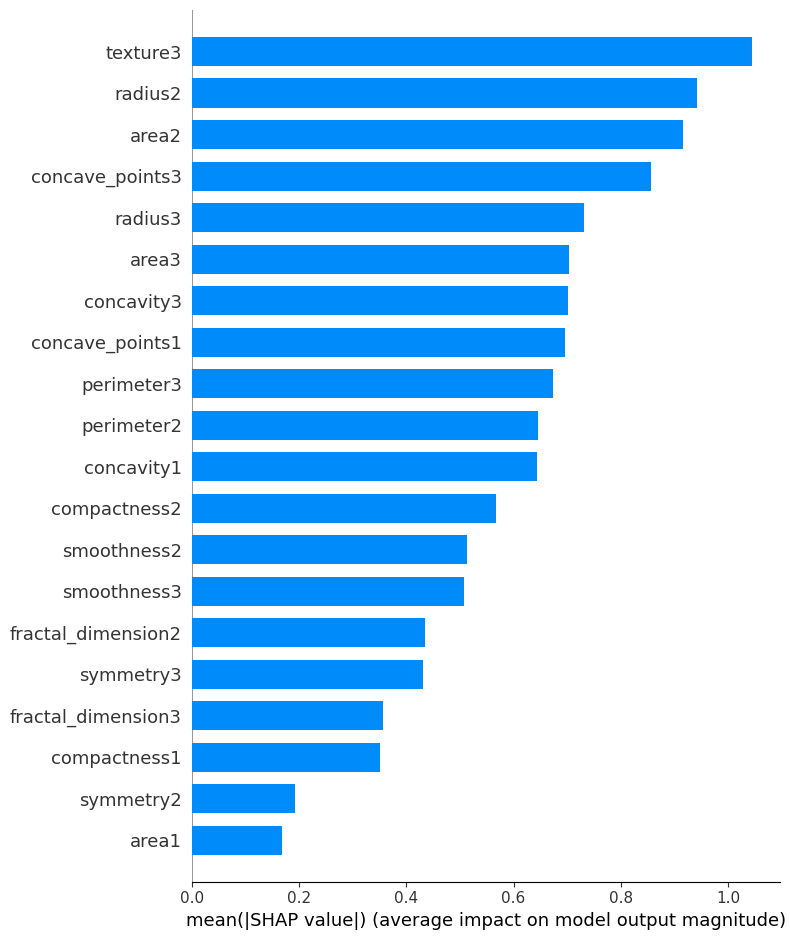

In [28]:
# Feature importance plot (mean absolute SHAP value per feature)
shap.summary_plot(lr_shap_values, scaled_X_test, plot_type="bar")

In [29]:
# Force plot for the first test sample
shap.initjs()
shap.force_plot(lr_explainer.expected_value, lr_shap_values, scaled_X_test)

In [30]:
# Initialize JavaScript for interactive plots
shap.initjs()

# Force plot for the first test sample
shap.force_plot(lr_explainer.expected_value, lr_shap_values[0], scaled_X_test.iloc[0])

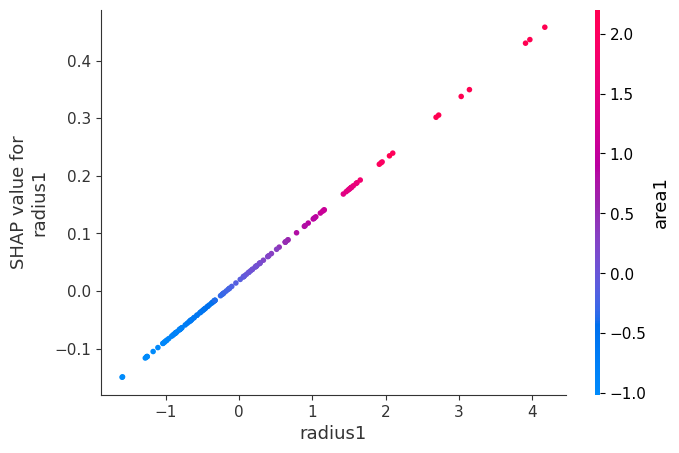

In [31]:
# Dependence plot for the first feature
shap.dependence_plot(0, lr_shap_values, scaled_X_test)


Compare weights of all the models at the end to check to most important factors developing cancer

### Random Forest Classifier Model

In [69]:
# Define the objective function for Optuna
def objective(trial, X, y, k_folds=5):
    """
    Objective function for Optuna to optimize hyperparameters of a model based on multiple metrics.
    """
    # Suggest hyperparameters to optimize
    n_estimators = trial.suggest_categorical('n_estimators', [10, 50, 100])    # Number of trees in the forest
    max_depth = trial.suggest_int('max_depth', 3, 30, step=1)                   # Max depth of the trees
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)            # Minimum samples required to split a node
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)              # Minimum samples required in a leaf

    # Initialize the model with suggested hyperparameters
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        class_weight='balanced',
        random_state=12345
    )
    
    # Initialize Stratified KFold cross-validation
    cv = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=12345)

    # Initialize variables to store metrics
    accuracies = []
    precisions = []
    recalls = []
    f1_scores = []
    auc_roc_scores = []
    
    # Cross-validation loop
    for train_index, valid_index in cv.split(X, y):
        X_train, X_valid = X.iloc[train_index], X.iloc[valid_index]
        y_train, y_valid = y.iloc[train_index], y.iloc[valid_index]
        
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict the target
        y_pred = model.predict(X_valid)
        
        # Calculate the metrics
        accuracies.append(accuracy_score(y_valid, y_pred))
        precisions.append(precision_score(y_valid, y_pred, average='binary', zero_division=0))
        recalls.append(recall_score(y_valid, y_pred, average='binary'))
        f1_scores.append(f1_score(y_valid, y_pred, average='binary'))
        
        # AUC-ROC only for binary classification
        auc_roc_scores.append(roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]))

    # Calculate the average of the metrics across folds
    avg_accuracy = np.mean(accuracies)
    avg_precision = np.mean(precisions)
    avg_recall = np.mean(recalls)
    avg_f1_score = np.mean(f1_scores)
    avg_auc_roc = np.mean(auc_roc_scores)

    # For the optimization, we might prioritize certain metrics
    # For example, you can prioritize F1-score and ROC-AUC for better balanced performance
    score = (avg_f1_score + avg_auc_roc) / 2  # You can adjust the weights depending on your priority
    
    return score

# Create the Optuna study
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=12345))  # We want to maximize the score

# Optimize for the best hyperparameters using K-fold cross-validation and multiple metrics
study.optimize(lambda trial: objective(trial, X_train, y_train, k_folds=5), n_trials=30)

# Output the best hyperparameters found
print("Best hyperparameters:", study.best_params)
print("Best score (avg. F1 + AUC-ROC):", study.best_value)


[I 2025-07-07 15:40:55,013] A new study created in memory with name: no-name-90674fc2-a06d-4138-87d7-2a3b255861fb
[I 2025-07-07 15:40:55,260] Trial 0 finished with value: 0.9461717987459379 and parameters: {'n_estimators': 10, 'max_depth': 8, 'min_samples_split': 12, 'min_samples_leaf': 12}. Best is trial 0 with value: 0.9461717987459379.
[I 2025-07-07 15:40:55,329] Trial 1 finished with value: 0.9364667970361864 and parameters: {'n_estimators': 10, 'max_depth': 21, 'min_samples_split': 16, 'min_samples_leaf': 20}. Best is trial 0 with value: 0.9461717987459379.
[I 2025-07-07 15:40:55,714] Trial 2 finished with value: 0.9513522857725436 and parameters: {'n_estimators': 100, 'max_depth': 21, 'min_samples_split': 17, 'min_samples_leaf': 18}. Best is trial 2 with value: 0.9513522857725436.
[I 2025-07-07 15:40:55,783] Trial 3 finished with value: 0.9536938374013275 and parameters: {'n_estimators': 10, 'max_depth': 23, 'min_samples_split': 10, 'min_samples_leaf': 7}. Best is trial 3 with va

Best hyperparameters: {'n_estimators': 50, 'max_depth': 29, 'min_samples_split': 2, 'min_samples_leaf': 1}
Best score (avg. F1 + AUC-ROC): 0.9702676950297879


In [33]:
rfc_model = RandomForestClassifier(
        n_estimators=study.best_params['n_estimators'],
        max_depth=study.best_params['max_depth'],
        min_samples_split=study.best_params['min_samples_split'],
        min_samples_leaf=study.best_params['min_samples_leaf'],
        class_weight='balanced',
        random_state=12345
    )

In [34]:
kfold_cross_validation(rfc_model, X_train, y_train)

{'accuracy': np.float64(0.9648700410396718),
 'precision': np.float64(0.9511525974025975),
 'recall': np.float64(0.95625),
 'f1_score': np.float64(0.9527383245064998),
 'auc_roc': np.float64(0.987797065553076),
 'confusion_matrix': array([[51.8,  1.6],
        [ 1.4, 30.4]])}

In [35]:
#Train the RFC model for the final evaluation
rfc_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=29, n_estimators=50,
                       random_state=12345)

In [36]:
rfc_model.feature_importances_

array([0.01880738, 0.01859199, 0.05879897, 0.01992139, 0.00703417,
       0.00864035, 0.11045667, 0.03366499, 0.00193127, 0.0042203 ,
       0.01404634, 0.00363808, 0.01878532, 0.03567786, 0.00431438,
       0.00475394, 0.00518414, 0.00318586, 0.00531245, 0.00587035,
       0.15108367, 0.02106644, 0.0836446 , 0.11810732, 0.01229469,
       0.00833296, 0.05778043, 0.14947932, 0.01007998, 0.0052944 ])

In [37]:
rfc_model.feature_importances_.argsort()

array([ 8, 17, 11,  9, 14, 15, 16, 29, 18, 19,  4, 25,  5, 28, 24, 10,  1,
       12,  0,  3, 21,  7, 13, 26,  2, 22,  6, 23, 27, 20])

Text(0.5, 0, 'Random Forest Feature Importance')

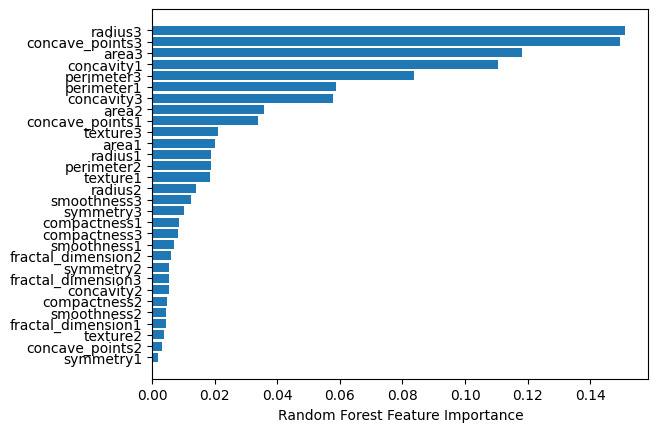

In [38]:
features_series = pd.Series(X.columns)
sorted_idx = rfc_model.feature_importances_.argsort()
plt.barh(features_series[sorted_idx], rfc_model.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")   

Text(0.5, 0, 'Permutation Importance')

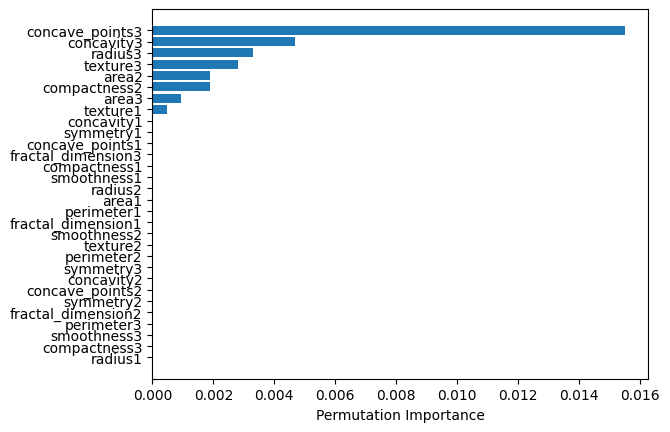

In [39]:
perm_importance = permutation_importance(rfc_model, X_train, y_train)

sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(features_series[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [40]:
# Create SHAP TreeExplainer for the trained Random Forest model
rfc_explainer = shap.TreeExplainer(rfc_model)

In [41]:
# Generate SHAP values for the test set
rfc_shap_values = rfc_explainer.shap_values(X_test)

In [42]:
# Select SHAP values for class 1
rfc_shap_values_class_1 = rfc_shap_values[:, :, 1]  # Slice for class 1

# Check the shape of the new SHAP values array
print("Shape of SHAP values for class 1 (after s" \
"licing):", rfc_shap_values_class_1.shape)

Shape of SHAP values for class 1 (after slicing): (143, 30)


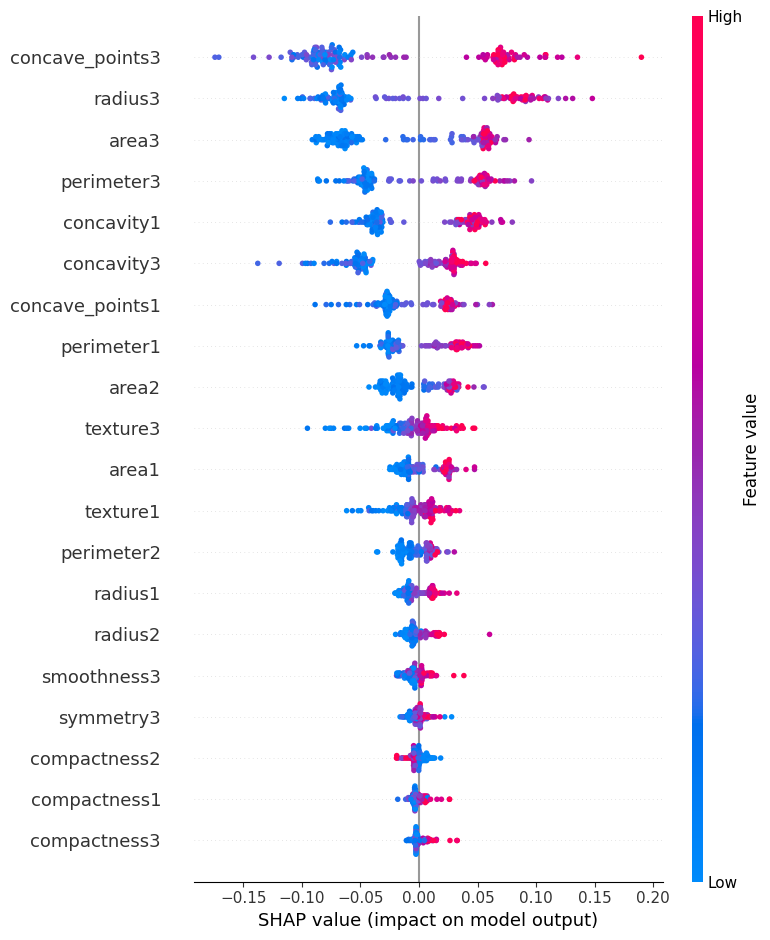

In [43]:
# Summary plot for the entire dataset
shap.summary_plot(rfc_shap_values_class_1, X_test)

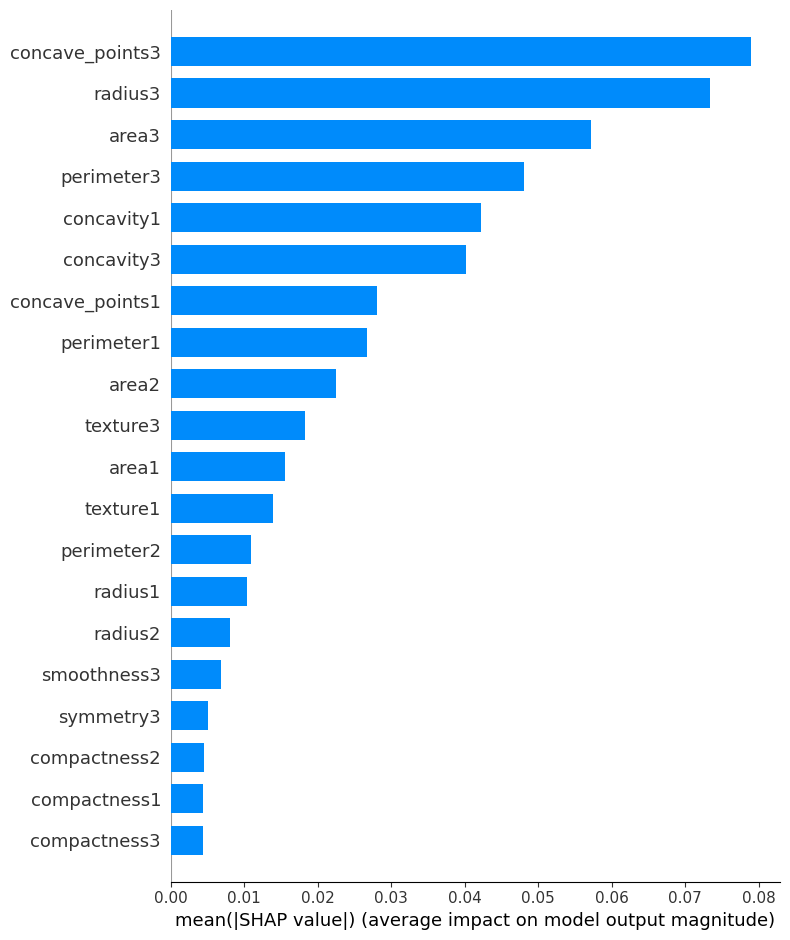

In [44]:
# Summary plot for the entire dataset
shap.summary_plot(rfc_shap_values_class_1, X_test, plot_type='bar')

### Gradient Boosting Classifier Model

In [70]:
# Define the objective function for Optuna
def objective(trial, X, y, k_folds=5):
    """
    Objective function for Optuna to optimize hyperparameters of a model based on multiple metrics.
    """
    # Suggest hyperparameters to optimize
    n_estimators = trial.suggest_categorical('n_estimators', [10, 50, 100])    # Number of trees in the forest
    max_depth = trial.suggest_int('max_depth', 3, 30, step=1)                   # Max depth of the trees
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)            # Minimum samples required to split a node
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)              # Minimum samples required in a leaf
    learning_rate = trial.suggest_float('learning_rate', 0.1, 1, step=0.1)

    # Initialize the model with suggested hyperparameters
    model = lgb.LGBMClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        learning_rate=learning_rate,
        class_weight='balanced',
        random_state=12345
    )
    
    # Initialize Stratified KFold cross-validation
    cv = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=12345)

    # Initialize variables to store metrics
    accuracies = []
    precisions = []
    recalls = []
    f1_scores = []
    auc_roc_scores = []
    
    # Cross-validation loop
    for train_index, valid_index in cv.split(X, y):
        X_train, X_valid = X.iloc[train_index], X.iloc[valid_index]
        y_train, y_valid = y.iloc[train_index], y.iloc[valid_index]
        
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict the target
        y_pred = model.predict(X_valid)
        
        # Calculate the metrics
        accuracies.append(accuracy_score(y_valid, y_pred))
        precisions.append(precision_score(y_valid, y_pred, average='binary', zero_division=0))
        recalls.append(recall_score(y_valid, y_pred, average='binary'))
        f1_scores.append(f1_score(y_valid, y_pred, average='binary'))
        
        # AUC-ROC only for binary classification
        auc_roc_scores.append(roc_auc_score(y_valid, model.predict_proba(X_valid)[:, 1]))

    # Calculate the average of the metrics across folds
    avg_accuracy = np.mean(accuracies)
    avg_precision = np.mean(precisions)
    avg_recall = np.mean(recalls)
    avg_f1_score = np.mean(f1_scores)
    avg_auc_roc = np.mean(auc_roc_scores)

    # For the optimization, we might prioritize certain metrics
    # For example, you can prioritize F1-score and ROC-AUC for better balanced performance
    score = (avg_f1_score + avg_auc_roc) / 2  # You can adjust the weights depending on your priority
    
    return score

# Create the Optuna study
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=12345))  # We want to maximize the score

# Optimize for the best hyperparameters using K-fold cross-validation and multiple metrics
study.optimize(lambda trial: objective(trial, X_train, y_train, k_folds=5), n_trials=30)

# Output the best hyperparameters found
print("Best hyperparameters:", study.best_params)
print("Best score (avg. F1 + AUC-ROC):", study.best_value)

[I 2025-07-07 15:42:03,430] A new study created in memory with name: no-name-fa567368-fd7c-4d53-930f-e085997919e0
[I 2025-07-07 15:42:03,730] Trial 0 finished with value: 0.9627203126559999 and parameters: {'n_estimators': 10, 'max_depth': 8, 'min_samples_split': 12, 'min_samples_leaf': 12, 'learning_rate': 1.0}. Best is trial 0 with value: 0.9627203126559999.


[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=12. Current value: min_data_in_leaf=12
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=12. Current value: min_data_in_leaf=12
[LightGBM] [Info] Number of positive: 127, number of negative: 213
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002489 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 340, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

[I 2025-07-07 15:42:04,597] Trial 1 finished with value: 0.9312803398059823 and parameters: {'n_estimators': 50, 'max_depth': 23, 'min_samples_split': 20, 'min_samples_leaf': 1, 'learning_rate': 0.2}. Best is trial 0 with value: 0.9627203126559999.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:04,885] Trial 2 finished with value: 0.9687596147033913 and parameters: {'n_estimators': 100, 'max_depth': 27, 'min_samples_split': 20, 'min_samples_leaf': 15, 'learning_rate': 0.7000000000000001}. Best is trial 2 with value: 0.9687596147033913.


[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Info] Number of positive: 127, number of negative: 214
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 341, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Lig

[I 2025-07-07 15:42:04,988] Trial 3 finished with value: 0.9698773007877923 and parameters: {'n_estimators': 10, 'max_depth': 15, 'min_samples_split': 15, 'min_samples_leaf': 20, 'learning_rate': 0.7000000000000001}. Best is trial 3 with value: 0.9698773007877923.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by

[I 2025-07-07 15:42:05,136] Trial 4 finished with value: 0.9220142121826194 and parameters: {'n_estimators': 10, 'max_depth': 25, 'min_samples_split': 19, 'min_samples_leaf': 1, 'learning_rate': 0.5}. Best is trial 3 with value: 0.9698773007877923.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=17. Current value: min_data_in_leaf=17
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min

[I 2025-07-07 15:42:05,398] Trial 5 finished with value: 0.9649234205851294 and parameters: {'n_estimators': 50, 'max_depth': 28, 'min_samples_split': 15, 'min_samples_leaf': 17, 'learning_rate': 0.6}. Best is trial 3 with value: 0.9698773007877923.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:05,534] Trial 6 finished with value: 0.9656104432610293 and parameters: {'n_estimators': 10, 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 10, 'learning_rate': 0.8}. Best is trial 3 with value: 0.9698773007877923.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=10. Current value: min_data_in_leaf=10
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=13. Current value: min_data_in_leaf=13
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=13. Current value: min_data_in_leaf=13
[LightGBM] [Info] Number of positive: 127, number of negative: 213
[LightGBM] [Info] Auto-cho

[I 2025-07-07 15:42:06,095] Trial 7 finished with value: 0.9623159436162689 and parameters: {'n_estimators': 50, 'max_depth': 24, 'min_samples_split': 19, 'min_samples_leaf': 13, 'learning_rate': 0.2}. Best is trial 3 with value: 0.9698773007877923.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:06,429] Trial 8 finished with value: 0.9585655606904318 and parameters: {'n_estimators': 100, 'max_depth': 28, 'min_samples_split': 9, 'min_samples_leaf': 7, 'learning_rate': 0.6}. Best is trial 3 with value: 0.9698773007877923.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:06,671] Trial 9 finished with value: 0.9708092691063478 and parameters: {'n_estimators': 100, 'max_depth': 25, 'min_samples_split': 12, 'min_samples_leaf': 20, 'learning_rate': 0.7000000000000001}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:07,073] Trial 10 finished with value: 0.96860193689369 and parameters: {'n_estimators': 100, 'max_depth': 19, 'min_samples_split': 3, 'min_samples_leaf': 20, 'learning_rate': 0.4}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:07,211] Trial 11 finished with value: 0.9654428607200957 and parameters: {'n_estimators': 10, 'max_depth': 15, 'min_samples_split': 14, 'min_samples_leaf': 20, 'learning_rate': 1.0}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Info] 

[I 2025-07-07 15:42:07,379] Trial 12 finished with value: 0.9678852343086477 and parameters: {'n_estimators': 100, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf': 17, 'learning_rate': 0.8}. Best is trial 9 with value: 0.9708092691063478.
[I 2025-07-07 15:42:07,502] Trial 13 finished with value: 0.9644063033416962 and parameters: {'n_estimators': 10, 'max_depth': 17, 'min_samples_split': 15, 'min_samples_leaf': 20, 'learning_rate': 0.8}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:07,939] Trial 14 finished with value: 0.9642000630261185 and parameters: {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 12, 'min_samples_leaf': 7, 'learning_rate': 0.4}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=7. Current value: min_data_in_leaf=7
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=7. Current value: min_data_in_leaf=7
[LightGBM] [Info] Number of positive: 127, number of negative: 214
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3408
[LightGBM] [Info] Number of data points in the train set: 341, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:08,326] Trial 15 finished with value: 0.9604525649980697 and parameters: {'n_estimators': 10, 'max_depth': 14, 'min_samples_split': 17, 'min_samples_leaf': 17, 'learning_rate': 0.9}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_chil

[I 2025-07-07 15:42:08,614] Trial 16 finished with value: 0.9683342852299641 and parameters: {'n_estimators': 100, 'max_depth': 11, 'min_samples_split': 8, 'min_samples_leaf': 16, 'learning_rate': 0.7000000000000001}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:09,108] Trial 17 finished with value: 0.9672763498336845 and parameters: {'n_estimators': 100, 'max_depth': 20, 'min_samples_split': 13, 'min_samples_leaf': 9, 'learning_rate': 0.4}. Best is trial 9 with value: 0.9708092691063478.
[I 2025-07-07 15:42:09,247] Trial 18 finished with value: 0.955261692534269 and parameters: {'n_estimators': 10, 'max_depth': 30, 'min_samples_split': 17, 'min_samples_leaf': 14, 'learning_rate': 0.7000000000000001}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:09,487] Trial 19 finished with value: 0.962751142072125 and parameters: {'n_estimators': 50, 'max_depth': 5, 'min_samples_split': 7, 'min_samples_leaf': 18, 'learning_rate': 0.5}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=18. Current value: min_data_in_leaf=18
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=19. Current value: min_data_in_leaf=19
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=19. Current value: min_data_in_leaf=19
[LightGBM] [Info] Number of positive: 127, number of negative: 213
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 340, number of used features: 30
[LightGBM] [Info] [bin

[I 2025-07-07 15:42:09,713] Trial 20 finished with value: 0.9652357636995115 and parameters: {'n_estimators': 100, 'max_depth': 13, 'min_samples_split': 5, 'min_samples_leaf': 19, 'learning_rate': 0.9}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:10,060] Trial 21 finished with value: 0.9687596147033913 and parameters: {'n_estimators': 100, 'max_depth': 23, 'min_samples_split': 17, 'min_samples_leaf': 15, 'learning_rate': 0.7000000000000001}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:10,403] Trial 22 finished with value: 0.9655730152975794 and parameters: {'n_estimators': 100, 'max_depth': 26, 'min_samples_split': 11, 'min_samples_leaf': 15, 'learning_rate': 0.6}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:10,683] Trial 23 finished with value: 0.9687272793326357 and parameters: {'n_estimators': 100, 'max_depth': 17, 'min_samples_split': 16, 'min_samples_leaf': 18, 'learning_rate': 0.7000000000000001}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:11,044] Trial 24 finished with value: 0.9625436877970104 and parameters: {'n_estimators': 100, 'max_depth': 30, 'min_samples_split': 19, 'min_samples_leaf': 13, 'learning_rate': 0.9}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:11,293] Trial 25 finished with value: 0.9532647256332969 and parameters: {'n_estimators': 10, 'max_depth': 22, 'min_samples_split': 14, 'min_samples_leaf': 19, 'learning_rate': 0.8}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=19. Current value: min_data_in_leaf=19
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=19. Current value: min_data_in_leaf=19
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=19. Current value: min_data_in_leaf=19
[

[I 2025-07-07 15:42:11,715] Trial 26 finished with value: 0.9652402308881921 and parameters: {'n_estimators': 100, 'max_depth': 27, 'min_samples_split': 10, 'min_samples_leaf': 15, 'learning_rate': 0.5}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:12,364] Trial 27 finished with value: 0.9619455858170711 and parameters: {'n_estimators': 100, 'max_depth': 21, 'min_samples_split': 20, 'min_samples_leaf': 11, 'learning_rate': 0.30000000000000004}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:12,721] Trial 28 finished with value: 0.9621406921486028 and parameters: {'n_estimators': 50, 'max_depth': 18, 'min_samples_split': 18, 'min_samples_leaf': 4, 'learning_rate': 0.6}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-07-07 15:42:13,092] Trial 29 finished with value: 0.9658540125838643 and parameters: {'n_estimators': 10, 'max_depth': 15, 'min_samples_split': 12, 'min_samples_leaf': 12, 'learning_rate': 1.0}. Best is trial 9 with value: 0.9708092691063478.


[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=12. Current value: min_data_in_leaf=12
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=12. Current value: min_data_in_leaf=12
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=12. Current value: min_data_in_leaf=12
[LightGBM] [Info] Number of positive: 127, number of negative: 214
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3408
[LightGBM] [Info] Number of data points in the train set: 341, number of used features: 30
[LightGBM] [Info] [bin

In [71]:
lgb_model = lgb.LGBMClassifier(
        n_estimators=study.best_params['n_estimators'],
        max_depth=study.best_params['max_depth'],
        min_samples_split=study.best_params['min_samples_split'],
        min_samples_leaf=study.best_params['min_samples_leaf'],
        class_weight='balanced',
        random_state=12345
    )

In [72]:
kfold_cross_validation(lgb_model, X_train, y_train)

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Info] Number of positive: 127, number of negative: 213
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001061 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3402
[LightGBM] [Info] Number of data points in the train set: 340, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

{'accuracy': np.float64(0.9600820793433653),
 'precision': np.float64(0.9698039215686276),
 'recall': np.float64(0.9247983870967742),
 'f1_score': np.float64(0.9455884147581661),
 'auc_roc': np.float64(0.9912368127409211),
 'confusion_matrix': array([[52.4,  1. ],
        [ 2.4, 29.4]])}

In [73]:
#Train the LGB model for the final evaluation
lgb_model.fit(X_train, y_train)

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Info] Number of positive: 159, number of negative: 267
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4266
[LightGBM] [Info] Number of data points in the train set: 426, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

LGBMClassifier(class_weight='balanced', max_depth=25, min_samples_leaf=20,
               min_samples_split=12, random_state=12345)

Text(0.5, 0, 'Random Forest Feature Importance')

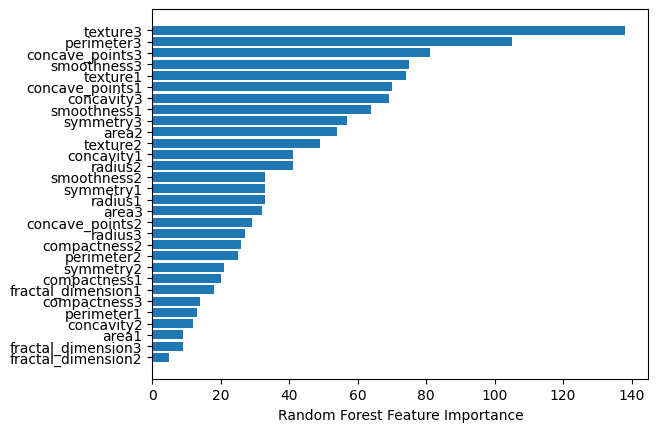

In [49]:
features_series = pd.Series(X.columns)
sorted_idx = lgb_model.feature_importances_.argsort()
plt.barh(features_series[sorted_idx], lgb_model.feature_importances_[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=15. Current value: min_data_in_leaf=15
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf

Text(0.5, 0, 'Permutation Importance')

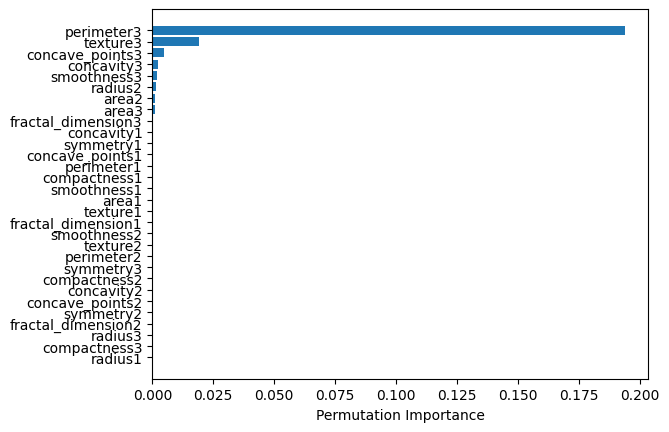

In [50]:
perm_importance = permutation_importance(lgb_model, X_train, y_train)

sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(features_series[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

In [51]:
# Create SHAP explainer
lgb_explainer = shap.TreeExplainer(lgb_model)

# Calculate SHAP values for the test set
lgb_shap_values = lgb_explainer.shap_values(X_test)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/shap/explainers/_tree.py:583: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


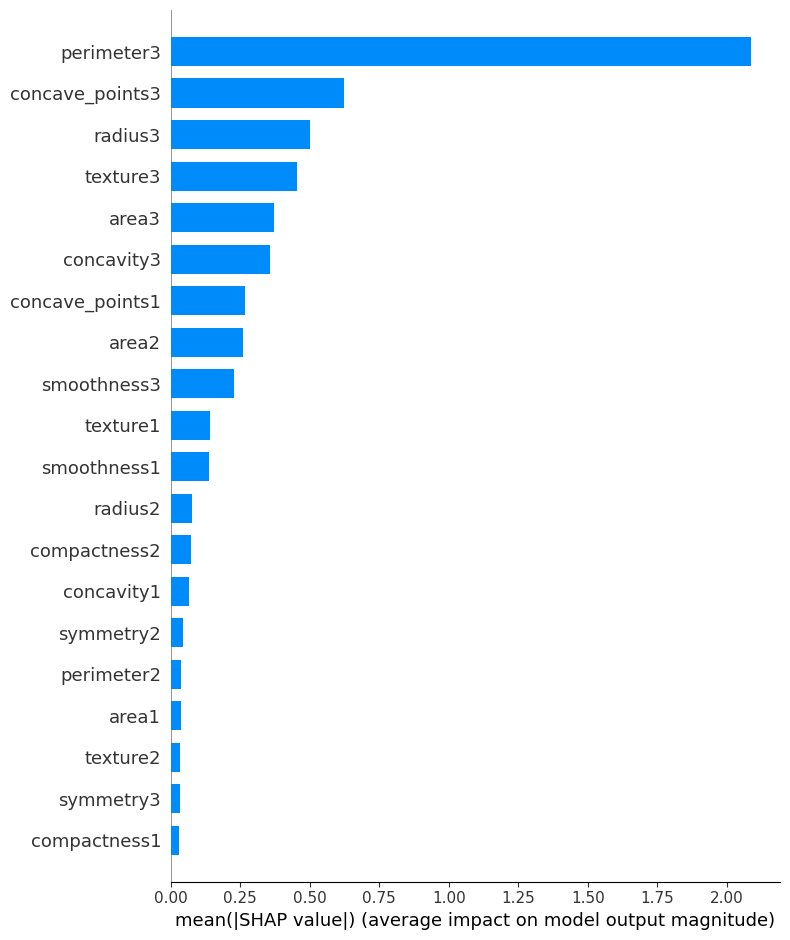

In [52]:
shap.summary_plot(lgb_shap_values, X_test, plot_type="bar")

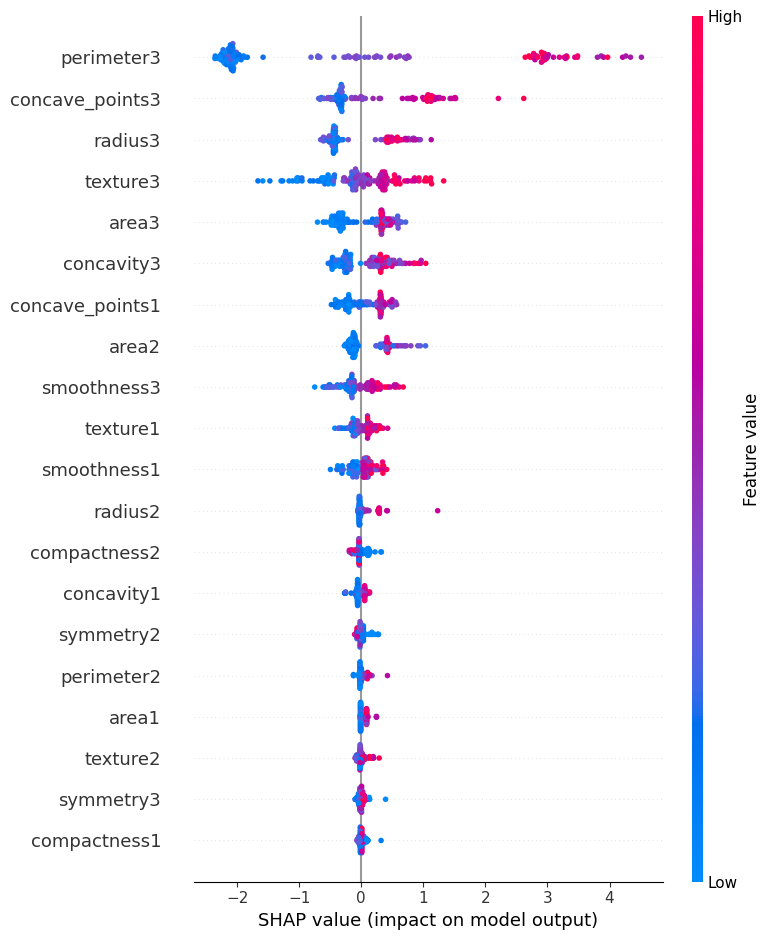

In [53]:
shap.summary_plot(lgb_shap_values, X_test)

In [54]:
class ShapAnalysis():
    
    def __init__(self, df):
        shap_values = explainer(df)
        self._shap_values = shap_values
        self._instance_names = df.index.to_list()
        self._feature_names = df.columns.to_list()
        self.df_shap = pd.DataFrame(
            shap_values.values, 
            columns=df.columns, 
            index=df.index
        )
        
    def waterfall(self, i, **kwargs):
        shap_values = self._shap_values
        shap_object = shap.Explanation(
                base_values = shap_values[i][0].base_values, 
                values = shap_values[i].values,
                feature_names = self._feature_names,
                instance_names=self._instance_names,
                data = shap_values[i].data,
        )
        shap.plots.waterfall(shap_object, **kwargs)

### Deep Learning Model

In [55]:
# Reproducibility seed
SEED = 12345
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

In [56]:
# Objective function for Optuna
def objective(trial: Trial):
    # Hyperparameter search space
    num_layers = trial.suggest_int('num_layers', 2, 5)  # Number of hidden layers (tuning this)
    units = trial.suggest_int('units', 64, 512, step=64)  # Number of units per layer
    dropout = trial.suggest_float('dropout', 0.2, 0.5)  # Dropout rate
    lr = trial.suggest_loguniform('lr', 1e-5, 1e-2)  # Learning rate

    # Build the model
    model = Sequential()

    # Input layer (first layer)
    model.add(Dense(units, input_dim=scaled_X_train.shape[1], activation='relu'))

    # Add the specified number of hidden layers
    for _ in range(num_layers - 1):
        model.add(Dense(units, activation='relu'))
        model.add(Dropout(dropout))  # Apply dropout to each layer

    # Output layer for binary classification
    model.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

    # Compile the model with binary crossentropy loss and multiple metrics
    model.compile(optimizer=Adam(learning_rate=lr),
                  loss='binary_crossentropy',  # Binary crossentropy for binary classification
                  metrics=['accuracy', 'AUC', 'Precision', 'Recall'])

    # Train the model
    model.fit(scaled_X_train, y_train, epochs=5, batch_size=32, verbose=0, validation_split=0.2)

    # Evaluate the model
    score = model.evaluate(scaled_X_test, y_test, verbose=0)

    # Get the metrics
    accuracy = score[0]
    auc = score[1]
    precision = score[2]
    recall = score[3]
    
    # Calculate F1-score manually from precision and recall
    f1 = 2 * (precision * recall) / (precision + recall + 1e-7)  # Avoid division by zero
    
    # Return the F1-score as the metric to maximize
    return f1

# Create a study and optimize
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=12345))  # Maximize the F1-score
study.optimize(objective, n_trials=50)

# Get the best hyperparameters
best_params = study.best_params
print(f"Best hyperparameters: {best_params}")



[I 2025-07-07 08:21:57,951] A new study created in memory with name: no-name-e53cf63a-92be-4252-9b35-bc1a5b9bffeb
/var/folders/rd/tgzdftq167g5kmmj_jjf8r8c0000gn/T/ipykernel_34771/2413127379.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  lr = trial.suggest_loguniform('lr', 1e-5, 1e-2)  # Learning rate
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
[I 2025-07-07 08:21:59,731] Trial 0 finished with value: 0.9946253068510674 and parameters: {'num_layers': 5, 'units': 192, 'dropout': 0.2551756435031283, 'lr': 

Best hyperparameters: {'num_layers': 2, 'units': 512, 'dropout': 0.31566886710155706, 'lr': 5.317596234794213e-05}


In [57]:
# Retrain the model with the best hyperparameters
dl_model = Sequential()

# Input layer (first layer)
dl_model.add(Dense(best_params['units'], input_dim=scaled_X_train.shape[1], activation='relu'))

# Add the best number of hidden layers
for _ in range(best_params['num_layers'] - 1):
    dl_model.add(Dense(best_params['units'], activation='relu'))
    dl_model.add(Dropout(best_params['dropout']))  # Dropout

# Output layer
dl_model.add(Dense(1, activation='sigmoid'))

dl_model.compile(optimizer=Adam(learning_rate=best_params['lr']),
                   loss='binary_crossentropy',
                   metrics=['accuracy', 'AUC', 'Precision', 'Recall'])

# Retrain the best model
historial = dl_model.fit(scaled_X_train, y_train, epochs=10, batch_size=32, verbose=1, validation_split=0.2)

Epoch 1/10


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - AUC: 0.7179 - Precision: 0.5221 - Recall: 0.7996 - accuracy: 0.6213 - loss: 0.6653 - val_AUC: 0.9734 - val_Precision: 0.8485 - val_Recall: 0.8750 - val_accuracy: 0.8953 - val_loss: 0.5560
Epoch 2/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.9683 - Precision: 0.8353 - Recall: 0.9341 - accuracy: 0.8988 - loss: 0.5336 - val_AUC: 0.9858 - val_Precision: 0.9032 - val_Recall: 0.8750 - val_accuracy: 0.9186 - val_loss: 0.4547
Epoch 3/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.9839 - Precision: 0.9074 - Recall: 0.9433 - accuracy: 0.9392 - loss: 0.4390 - val_AUC: 0.9907 - val_Precision: 0.9333 - val_Recall: 0.8750 - val_accuracy: 0.9302 - val_loss: 0.3801
Epoch 4/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.9867 - Precision: 0.9319 - Recall: 0.9190 - accuracy: 0.9413 - loss: 0.3675 - val_AUC: 0.9916 - val_Precision: 0.9333 - val_Recall: 0.8750 - val_accuracy: 0.9302 - val_loss: 0.3241
Epoch 5/10
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

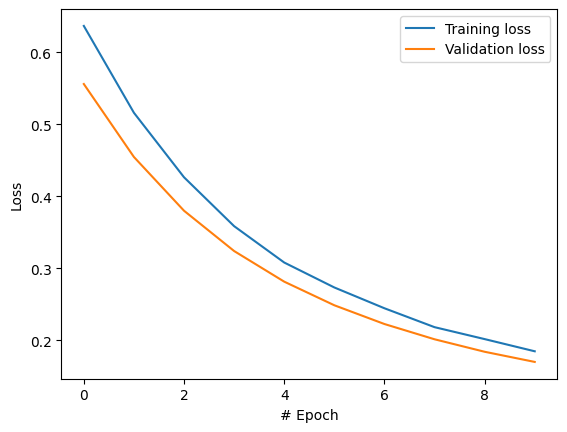

In [58]:
plt.xlabel("# Epoch")
plt.ylabel("Loss")
plt.plot(historial.history["loss"], label='Training loss')
plt.plot(historial.history['val_loss'], label='Validation loss')
plt.legend()
plt.show()

## Final evaluation of every model in Test Sets

In [59]:
def test_evaluation(model, X_test, y_test):
    """
    Evaluates a model on the final test set using the metrics: accuracy, precision, recall, F1, and AUC-ROC.

    Parameters:
    model: A pre-trained machine learning model.
    X_test: The set of features for the test set.
    y_test: The set of labels for the test set.

    Returns:
    dict: A dictionary containing the model's performance metrics on the test set.
    """
    
    # Predict the target with the trained model
    y_pred = model.predict(X_test)
    
    # Initialize a dictionary for metrics
    metrics = {}
    
    # Calculate performance metrics
    metrics['accuracy'] = accuracy_score(y_test, y_pred)
    metrics['precision'] = precision_score(y_test, y_pred, average='weighted', zero_division=0)
    metrics['recall'] = recall_score(y_test, y_pred, average='weighted')
    metrics['f1_score'] = f1_score(y_test, y_pred, average='weighted')
    
    # AUC-ROC only for binary or multiclass classification One-vs-Rest
    if len(np.unique(y_test)) == 2:  #For binary classification only
        metrics['auc_roc'] = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    else:
        try:
            metrics['auc_roc'] = roc_auc_score(y_test, model.predict_proba(X_test), multi_class='ovr')
        except ValueError:
            metrics['auc_roc'] = np.nan  # If AUC-ROC cannot be calculated, assign NaN

    # Confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    metrics['confusion_matrix'] = cm
    
    return metrics

In [60]:
print('Logistic Regression Model Test Performance')
test_evaluation(lr_model, scaled_X_test, y_test)

Logistic Regression Model Test Performance


{'accuracy': 0.965034965034965,
 'precision': np.float64(0.9649965419196188),
 'recall': np.float64(0.965034965034965),
 'f1_score': np.float64(0.9649650533628434),
 'auc_roc': np.float64(0.9846960167714884),
 'confusion_matrix': array([[88,  2],
        [ 3, 50]])}

In [61]:
print('Random Forest Classifier Model Test Performance')
test_evaluation(rfc_model, X_test, y_test)

Random Forest Classifier Model Test Performance


{'accuracy': 0.986013986013986,
 'precision': np.float64(0.9865225683407501),
 'recall': np.float64(0.986013986013986),
 'f1_score': np.float64(0.9860649130312052),
 'auc_roc': np.float64(0.999475890985325),
 'confusion_matrix': array([[88,  2],
        [ 0, 53]])}

In [74]:
print('LGBM Model Test Performance')
test_evaluation(lgb_model, X_test, y_test)

LGBM Model Test Performance
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=20. Current value: min_data_in_leaf=20


{'accuracy': 0.993006993006993,
 'precision': np.float64(0.9931364931364932),
 'recall': np.float64(0.993006993006993),
 'f1_score': np.float64(0.9930201370706775),
 'auc_roc': np.float64(0.9985324947589099),
 'confusion_matrix': array([[89,  1],
        [ 0, 53]])}

In [63]:
# Evaluate metrics of the dl_model in the test sets
# Get predictions
# The model returns probabilities, so we convert them to 0/1 classes
y_prob = dl_model.predict(scaled_X_test)
y_pred = (y_prob > 0.5).astype("int32").flatten()

# Metrics calculation
metrics = {}
metrics['accuracy'] = accuracy_score(y_test, y_pred)
metrics['precision'] = precision_score(y_test, y_pred, average='weighted', zero_division=0)
metrics['recall'] = recall_score(y_test, y_pred, average='weighted')
metrics['f1_score'] = f1_score(y_test, y_pred, average='weighted')
metrics['auc_roc'] = roc_auc_score(y_test, y_prob)

cm = confusion_matrix(y_test, y_pred)
metrics['confusion_matrix'] = cm

# Show results
print('Deep Learning Model Test Performance')
for key, value in metrics.items():
    if key == 'confusion_matrix':
        print(f"{key.capitalize()}:")
        print(value)  # Print the confusion matrix as it is
    else:
        print(f"{key.capitalize()}: {value:.4f}")  # Apply formatting only to scalar values

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
Deep Learning Model Test Performance
Accuracy: 0.9720
Precision: 0.9722
Recall: 0.9720
F1_score: 0.9719
Auc_roc: 0.9992
Confusion_matrix:
[[89  1]
 [ 3 50]]
